In [2]:
%matplotlib inline

In [3]:
from __future__ import division

In [4]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import patsy
import sklearn.linear_model as linear
import numpy.random as random
import nltk
import re

from sklearn.metrics import classification_report

from nltk.corpus import stopwords
from collections import Counter

sns.set(style="darkgrid")

In [5]:
def get_words_in_tweets(tweets):
    all_words = []
    for (words, sentiment) in tweets:
        all_words.extend(words)
    return all_words


def get_word_features(wordlist):
    wordlist = nltk.FreqDist(wordlist)
    word_features = wordlist.keys()
    return word_features

def extract_features(document):
    document_words = set(document)
    features = {}
    for word in word_features:
        features['contains(%s)' % word] = (word in document_words)
    return features


In [5]:
#reading BWI_DELAY file
project = pd.read_csv( "airline_python.csv")
project.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41396 entries, 0 to 41395
Data columns (total 2 columns):
airline_name      41396 non-null object
author_country    39805 non-null object
dtypes: object(2)
memory usage: 646.9+ KB


In [9]:
name = []
name = project['airline_name'].unique()

In [11]:
country = []
country = project['author_country'].unique()

In [17]:
df = pd.DataFrame(columns=['airline_name'])
df1 = pd.DataFrame(columns=['author_country'])

In [18]:
df['airline_name'] = name

In [19]:
df1['author_country'] = country

In [20]:
df.to_csv('out_airline_name.csv')

In [21]:
df1.to_csv('out_author_country.csv')

In [22]:
#reading BWI_DELAY file
project_clean = pd.read_csv( "airline-edge.csv")
project_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41396 entries, 0 to 41395
Data columns (total 3 columns):
from      41396 non-null object
to        39805 non-null object
weight    41396 non-null int64
dtypes: int64(1), object(2)
memory usage: 970.3+ KB


In [13]:
# function taken from notebook

def examine_data_frame( df):
    for name in df.columns:
        print "----------"
        print df[ name].value_counts()
        print "Name: ", name
        print df[ name].describe()

In [24]:
examine_data_frame(project_clean)

----------
spirit-airlines             990
british-airways             901
united-airlines             840
jet-airways                 727
air-canada-rouge            715
emirates                    691
ryanair                     658
american-airlines           612
lufthansa                   600
qantas-airways              580
etihad-airways              515
turkish-airlines            498
cathay-pacific-airways      494
qatar-airways               492
air-canada                  491
malaysia-airlines           484
allegiant-air               483
delta-air-lines             466
virgin-atlantic-airways     454
thomson-airways             453
norwegian                   449
easyjet                     447
singapore-airlines          432
us-airways                  425
frontier-airlines           417
aer-lingus                  416
china-southern-airlines     412
thomas-cook-airlines        410
air-france                  398
jetstar-airways             395
                           ..

In [27]:
project_clean = project_clean.dropna()

In [28]:
project_clean

,from,to,weight
0,adria-airways,Germany,1
1,adria-airways,United States,1
2,adria-airways,Switzerland,1
3,adria-airways,Singapore,1
4,adria-airways,Poland,1
5,adria-airways,Germany,1
6,adria-airways,France,1
7,adria-airways,Slovenia,1
8,adria-airways,Singapore,1
9,adria-airways,Slovenia,1


In [29]:
project_clean.to_csv('airline-edge-new.csv')

***Low cost v/s High Cost***

In [6]:
#reading BWI_DELAY file
low_cost_frame= pd.read_csv( "out_airline_name.csv")
low_cost_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 362 entries, 0 to 361
Data columns (total 2 columns):
airline_name    362 non-null object
low_cost        131 non-null object
dtypes: object(2)
memory usage: 5.7+ KB


In [7]:
low_cost_carrier1 = []
i = 0
for each in low_cost_frame.low_cost :
    if each == 'yes':
        low_cost_carrier1.append(low_cost_frame.airline_name[i])
        i = i+1
    else:
        i = i+1


In [8]:
len(low_cost_carrier1)

131

In [9]:
airline_main= pd.read_csv( "airline.csv")
airline_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41396 entries, 0 to 41395
Data columns (total 20 columns):
airline_name                     41396 non-null object
link                             41396 non-null object
title                            41396 non-null object
author                           41396 non-null object
author_country                   39805 non-null object
date                             41396 non-null object
content                          41396 non-null object
aircraft                         1278 non-null object
type_traveller                   2378 non-null object
cabin_flown                      38520 non-null object
route                            2341 non-null object
overall_rating                   36861 non-null float64
seat_comfort_rating              33706 non-null float64
cabin_staff_rating               33708 non-null float64
food_beverages_rating            33264 non-null float64
inflight_entertainment_rating    31114 non-null float64
ground_se

In [10]:
capture_low_cost = []
for each in airline_main['airline_name']:
    if each in low_cost_carrier1:
        capture_low_cost.append(1)     
    else:
        capture_low_cost.append(0)
        
    

In [11]:
airline_main['low_cost'] = capture_low_cost

In [14]:
examine_data_frame(airline_main)

----------
spirit-airlines             990
british-airways             901
united-airlines             840
jet-airways                 727
air-canada-rouge            715
emirates                    691
ryanair                     658
american-airlines           612
lufthansa                   600
qantas-airways              580
etihad-airways              515
turkish-airlines            498
cathay-pacific-airways      494
qatar-airways               492
air-canada                  491
malaysia-airlines           484
allegiant-air               483
delta-air-lines             466
virgin-atlantic-airways     454
thomson-airways             453
norwegian                   449
easyjet                     447
singapore-airlines          432
us-airways                  425
frontier-airlines           417
aer-lingus                  416
china-southern-airlines     412
thomas-cook-airlines        410
air-france                  398
jetstar-airways             395
                           ..

C:\Anaconda2\lib\site-packages\numpy\lib\function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


In [15]:
airline_main["content"][0]

"Outbound flight FRA/PRN A319. 2 hours 10 min flight. I thought drinks/snacks for sale but sandwich soft drinks were served complimentary. Inbound flights SKP/LJU/FRA CRJ900. each 1 hour 30 min flight. Skyshop menu was in a seat pocket and drinks/snacks were for sale. All flight crews were friendly. Security check at the Ljubljana airport for transit passengers was chaos however it's possible to go to a gate within 30min."

In [16]:
airline_main["recommended"].replace(0, "negative" ,inplace=True)
airline_main["recommended"].replace(1, "positive" ,inplace=True)

In [17]:
airline_main_polarity = airline_main[['content', 'recommended']]

In [18]:
airline_main_list = airline_main_polarity.values.tolist()

In [19]:
airline_main_list

[["Outbound flight FRA/PRN A319. 2 hours 10 min flight. I thought drinks/snacks for sale but sandwich soft drinks were served complimentary. Inbound flights SKP/LJU/FRA CRJ900. each 1 hour 30 min flight. Skyshop menu was in a seat pocket and drinks/snacks were for sale. All flight crews were friendly. Security check at the Ljubljana airport for transit passengers was chaos however it's possible to go to a gate within 30min.",
  'positive'],
 ['Two short hops ZRH-LJU and LJU-VIE. Very fast on CRJ 90. Seats comfortable and crew was fine. Ground services good and lounge was quite nice.',
  'positive'],
 ['Flew Zurich-Ljubljana on JP365 newish CRJ900. Flight almost full departure on time. Service on board by 2 pleasant and friendly female flight attendants. I bought coffee mineral water and a very nice and fresh filled croissant for EUR 6. Good value!',
  'positive'],
 ["Adria serves this 100 min flight from Ljubljana to Amsterdam on a brand new CRJ900 Next Gen which has a hugely improved 

In [20]:
tweets = []

for (words, sentiment) in airline_main_list[:4000]:
    words_filtered = [e.lower() for e in words.split() if len(e) >= 3]
    tweets.append((words_filtered, sentiment))

In [21]:
word_features = get_word_features(get_words_in_tweets(tweets))

In [22]:
extract_features("love the flight")

{'contains(corporate)': False,
 'contains(bkk.)': False,
 'contains(impatient.)': False,
 'contains(rent)': False,
 'contains(gets.)': False,
 'contains(empty,)': False,
 'contains(guided)': False,
 'contains(passage)': False,
 'contains(issues:)': False,
 "contains('goodwill')": False,
 'contains("yes")': False,
 'contains(explains)': False,
 'contains(rage.)': False,
 'contains(cup/sandwiches))': False,
 'contains(note:)': False,
 'contains(room).)': False,
 'contains(19.00)': False,
 'contains(2016)': False,
 'contains(commonly)': False,
 'contains(profitability)': False,
 'contains(propellers)': False,
 'contains(recline/lie)': False,
 'contains(method.)': False,
 'contains(cream))': False,
 'contains(jfk-txl-vie)': False,
 'contains(mex-jfk)': False,
 'contains(stayed)': False,
 'contains(b787.)': False,
 'contains(tested)': False,
 'contains(weighed)': False,
 'contains(oh-so-chinese)': False,
 'contains(difference.)': False,
 'contains(southern.)': False,
 'contains(represents)'

In [23]:
training_set = nltk.classify.apply_features(extract_features, tweets)

In [24]:
classifier = nltk.NaiveBayesClassifier.train(training_set)

In [100]:
tweet = 'cheap'
print classifier.classify(extract_features(tweet.split()))

positive


In [111]:
sentiment = []
for each in airline_main['content'][0:10000]:
    sentiment.append(classifier.classify(extract_features(each.split())))

In [112]:
len(sentiment)

10000

In [113]:
sentiment1 = []
for each in airline_main['content'][10000:20000]:
    sentiment1.append(classifier.classify(extract_features(each.split())))

In [114]:
len(sentiment1)

10000

In [115]:
sentiment11 = []
for each in airline_main['content'][20000:]:
    sentiment11.append(classifier.classify(extract_features(each.split())))

In [116]:
len(sentiment11)

21396

In [117]:
total_sentiment = sum([sentiment, sentiment1, sentiment11], [])

In [118]:
len(total_sentiment)

41396

In [119]:
airline_main['sentiment'] = total_sentiment

In [120]:
examine_data_frame(airline_main)

----------
spirit-airlines             990
british-airways             901
united-airlines             840
jet-airways                 727
air-canada-rouge            715
emirates                    691
ryanair                     658
american-airlines           612
lufthansa                   600
qantas-airways              580
etihad-airways              515
turkish-airlines            498
cathay-pacific-airways      494
qatar-airways               492
air-canada                  491
malaysia-airlines           484
allegiant-air               483
delta-air-lines             466
virgin-atlantic-airways     454
thomson-airways             453
norwegian                   449
easyjet                     447
singapore-airlines          432
us-airways                  425
frontier-airlines           417
aer-lingus                  416
china-southern-airlines     412
thomas-cook-airlines        410
air-france                  398
jetstar-airways             395
                           ..

In [121]:
airline_main.to_csv('airline_main_out.csv')

In [122]:
airline_main["recommended"].replace("negative", 0 ,inplace=True)
airline_main["recommended"].replace("positive", 1 ,inplace=True)

airline_main["sentiment"].replace("negative", 0 ,inplace=True)
airline_main["sentiment"].replace("positive", 1,inplace=True)

In [1]:
print(classification_report(airline_main["recommended"], airline_main["sentiment"]))

NameError: name 'classification_report' is not defined

In [127]:
airline_main['low_cost'].value_counts()

0    28586
1    12810
Name: low_cost, dtype: int64

In [134]:
#calculate number of positive and negative sentiments for low cost and high cost airlines
airline_main.groupby(['low_cost','sentiment']).size()

low_cost  sentiment
0         0            10097
          1            18489
1         0             6077
          1             6733
dtype: int64

In [157]:
# calculate mean of positive and negative sentiments for low cost and high cost airlines
airline_main['sentiment'].groupby(airline_main['low_cost']).mean()

low_cost
0    0.646785
1    0.525605
Name: sentiment, dtype: float64

In [149]:
# calculate the number of positive and negative sentiments for all airlines
airline_main.groupby(['low_cost','airline_name','sentiment']).size()

low_cost  airline_name                  sentiment
0         adria-airways                 0              7
                                        1             45
          aegean-airlines               0             45
                                        1            193
          aer-lingus                    0            121
                                        1            295
          aerocaribbean                 0              1
                                        1              2
          aeroflot-russian-airlines     0             52
                                        1            196
          aerogal-aerolineas-galapagos  0              4
                                        1              9
          aerolineas-argentinas         0             71
                                        1            101
          aeromexico                    0             57
                                        1             79
          aerosur                     

In [152]:
# calculate mean of positive sentiments for all airlines
airline_main['sentiment'].groupby([airline_main['low_cost'], airline_main['airline_name']]).mean()

low_cost  airline_name                
0         adria-airways                   0.865385
          aegean-airlines                 0.810924
          aer-lingus                      0.709135
          aerocaribbean                   0.666667
          aeroflot-russian-airlines       0.790323
          aerogal-aerolineas-galapagos    0.692308
          aerolineas-argentinas           0.587209
          aeromexico                      0.580882
          aerosur                         0.454545
          afriqiyah-airways               0.620690
          aigle-azur                      0.666667
          air-algerie                     0.542857
          air-astana                      0.908257
          air-bagan                       0.812500
          air-botswana                    0.684211
          air-canada                      0.431772
          air-caraibes                    0.600000
          air-china                       0.532751
          air-corsica                     1

***Low cost airlines in USA***

In [383]:
spirit = airline_main.groupby('airline_name')['sentiment'].mean()["spirit-airlines"]

In [384]:
jetblue = airline_main.groupby('airline_name')['sentiment'].mean()["jetblue-airways"]

In [385]:
southwest = airline_main.groupby('airline_name')['sentiment'].mean()["southwest-airlines"]

In [386]:
allegiant = airline_main.groupby('airline_name')['sentiment'].mean()["allegiant-air"]

In [387]:
frontier = airline_main.groupby('airline_name')['sentiment'].mean()["frontier-airlines"]

In [388]:
vamerica = airline_main.groupby('airline_name')['sentiment'].mean()["virgin-america"]

In [389]:
skywest = airline_main.groupby('airline_name')['sentiment'].mean()["skywest-airlines"]


In [390]:
horizon = airline_main.groupby('airline_name')['sentiment'].mean()["horizon-air"]

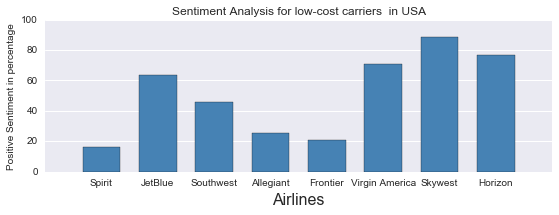

In [432]:
figure = plt.figure(figsize=(20, 6))

xs = [1, 2, 3, 4, 5, 6, 7, 8]
lc = [spirit*100, jetblue*100, southwest*100, allegiant*100, frontier*100, vamerica*100, skywest*100, horizon*100 ]


width = 1/1.5

axes = figure.add_subplot(2, 2, 1)

#axes.plot(xs, data, "o", color="steelblue")
plt.ylabel('Positive Sentiment in percentage', fontsize=10)
plt.xlabel('Airlines', fontsize=16)
#axes.vlines(xs, [0], data, linestyles='dotted', lw=2)
axes.bar(xs, lc, width, color="steelblue", align="center")
axes.set_xticks(xs)
axes.set_xlim((0, 9))
axes.set_ylim((0, 100))
axes.set_xticklabels(["Spirit", "JetBlue", "Southwest", "Allegiant", "Frontier","Virgin America","Skywest", "Horizon"])
axes.set_title('Sentiment Analysis for low-cost carriers  in USA')
axes.xaxis.grid(False)

*** high cost airlines in USA ***

In [374]:
aa = airline_main.groupby('airline_name')['sentiment'].mean()["american-airlines"]

In [375]:
delta = airline_main.groupby('airline_name')['sentiment'].mean()["delta-air-lines"]

In [376]:
united = airline_main.groupby('airline_name')['sentiment'].mean()["united-airlines"]

In [377]:
alaska = airline_main.groupby('airline_name')['sentiment'].mean()["alaska-airlines"]

In [378]:
hawaiian= airline_main.groupby('airline_name')['sentiment'].mean()["hawaiian-airlines"] 

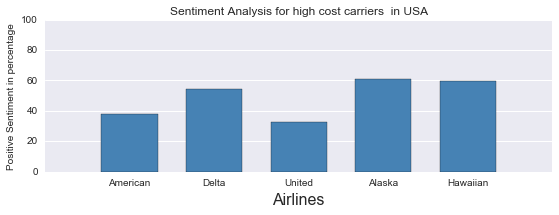

In [431]:
figure = plt.figure(figsize=(20, 6))

xs = [1, 2, 3, 4, 5]
hc = [aa*100, delta*100, united*100, alaska*100, hawaiian*100]


width = 1/1.5

axes = figure.add_subplot(2, 2, 1)

#axes.plot(xs, data, "o", color="steelblue")
plt.ylabel('Positive Sentiment in percentage', fontsize=10)
plt.xlabel('Airlines', fontsize=16)
#axes.vlines(xs, [0], data, linestyles='dotted', lw=2)
axes.bar(xs, hc, width, color="steelblue", align="center")
axes.set_xticks(xs)
axes.set_xlim((0, 6))
axes.set_ylim((0, 100))
axes.set_xticklabels(["American", "Delta", "United", "Alaska", "Hawaiian"])
axes.set_title('Sentiment Analysis for high cost carriers  in USA')
axes.xaxis.grid(False)

*** total high/Low cost airlines in USA ***

In [372]:
(airline_main.groupby('airline_name')['sentiment'].mean()["american-airlines"] + airline_main.groupby('airline_name')['sentiment'].mean()["delta-air-lines"] 
 + airline_main.groupby('airline_name')['sentiment'].mean()["united-airlines"] + airline_main.groupby('airline_name')['sentiment'].mean()["alaska-airlines"]
 + airline_main.groupby('airline_name')['sentiment'].mean()["hawaiian-airlines"] )/5

0.49241357697307447

In [373]:
( airline_main.groupby('airline_name')['sentiment'].mean()["spirit-airlines"]+ airline_main.groupby('airline_name')['sentiment'].mean()["jetblue-airways"]
+  airline_main.groupby('airline_name')['sentiment'].mean()["southwest-airlines"]+  airline_main.groupby('airline_name')['sentiment'].mean()["allegiant-air"]
+ airline_main.groupby('airline_name')['sentiment'].mean()["frontier-airlines"] + airline_main.groupby('airline_name')['sentiment'].mean()["virgin-america"]
+ airline_main.groupby('airline_name')['sentiment'].mean()["skywest-airlines"] + airline_main.groupby('airline_name')['sentiment'].mean()["horizon-air"])/8

0.51023787041973101

***checking other airlines***

In [396]:
vatlantic = airline_main.groupby('airline_name')['sentiment'].mean()["virgin-atlantic-airways"]

In [397]:
vaustralia = airline_main.groupby('airline_name')['sentiment'].mean()["virgin-australia"]

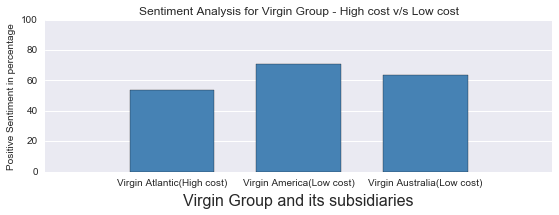

In [433]:
figure = plt.figure(figsize=(20, 6))

xs = [1, 2, 3]
hc = [vatlantic*100, vamerica*100, vaustralia*100]


width = 1/1.5

axes = figure.add_subplot(2, 2, 1)

#axes.plot(xs, data, "o", color="steelblue")
plt.ylabel('Positive Sentiment in percentage', fontsize=10)
plt.xlabel('Virgin Group and its subsidiaries', fontsize=16)
#axes.vlines(xs, [0], data, linestyles='dotted', lw=2)
axes.bar(xs, hc, width, color="steelblue", align="center")
axes.set_xticks(xs)
axes.set_xlim((0, 4))
axes.set_ylim((0, 100))
axes.set_xticklabels(["Virgin Atlantic(High cost)", "Virgin America(Low cost)", "Virgin Australia(Low cost)"])
axes.set_title('Sentiment Analysis for Virgin Group - High cost v/s Low cost')
axes.xaxis.grid(False)

*** Cabin flown in the USA low-cost vs high cost ***

*** in general***

In [205]:
airline_main['sentiment'].groupby([airline_main['low_cost'], airline_main['cabin_flown']]).mean()

low_cost  cabin_flown    
0         Business Class     0.754852
          Economy            0.615102
          First Class        0.685504
          Premium Economy    0.595986
1         Business Class     0.733615
          Economy            0.525219
          First Class        0.738462
          Premium Economy    0.445055
Name: sentiment, dtype: float64

*** Low-cost***

In [416]:
low_cost_economy = (airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["jetblue-airways", "Economy"] +  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["spirit-airlines", "Economy"]
 + airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["southwest-airlines", "Economy"]+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["allegiant-air", "Economy"]
+airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["virgin-america", "Economy"]+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["frontier-airlines", "Economy"]
+ airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["skywest-airlines", "Economy"]+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["horizon-air", "Economy"])/8

In [417]:
low_cost_business = (airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["jetblue-airways", "Business Class"] 
 + airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["southwest-airlines", "Business Class"]
+ airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["allegiant-air", "Business Class"])/3

In [425]:
low_cost_first = (airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["spirit-airlines", "First Class"]
 + airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["allegiant-air", "First Class"]
+airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["virgin-america", "First Class"]
 +  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["frontier-airlines", "First Class"]
+ airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["skywest-airlines", "First Class"])/5

In [406]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["spirit-airlines"]

cabin_flown
Business Class     0.000000
Economy            0.113971
First Class        0.500000
Premium Economy    0.000000
Name: sentiment, dtype: float64

In [198]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["jetblue-airways"]

cabin_flown
Business Class    0.500000
Economy           0.583333
Name: sentiment, dtype: float64

In [199]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["southwest-airlines"]

cabin_flown
Business Class     0.80000
Economy            0.45283
Premium Economy    1.00000
Name: sentiment, dtype: float64

In [200]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["allegiant-air"]

cabin_flown
Business Class     0.000000
Economy            0.256785
First Class        0.000000
Premium Economy    0.000000
Name: sentiment, dtype: float64

In [201]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["frontier-airlines"]

cabin_flown
Economy            0.194444
First Class        0.000000
Premium Economy    0.285714
Name: sentiment, dtype: float64

In [202]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["virgin-america"]

cabin_flown
Economy            0.674286
First Class        0.833333
Premium Economy    0.875000
Name: sentiment, dtype: float64

In [210]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["skywest-airlines"]

cabin_flown
Economy            0.875
First Class        1.000
Premium Economy    1.000
Name: sentiment, dtype: float64

In [209]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["horizon-air"]

cabin_flown
Economy    0.7
Name: sentiment, dtype: float64

*** high-cost***

In [418]:
high_cost_economy = ( airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["american-airlines", "Economy"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["delta-air-lines", "Economy"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["united-airlines", "Economy"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["alaska-airlines",  "Economy"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["hawaiian-airlines",  "Economy"])/5

In [419]:
high_cost_business = ( airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["american-airlines", "Business Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["delta-air-lines", "Business Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["united-airlines", "Business Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["alaska-airlines",  "Business Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["hawaiian-airlines",  "Business Class"])/5

In [426]:
high_cost_first = ( airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["american-airlines", "First Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["delta-air-lines", "First Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["united-airlines", "First Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["alaska-airlines",  "First Class"]
+  airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["hawaiian-airlines",  "First Class"])/5

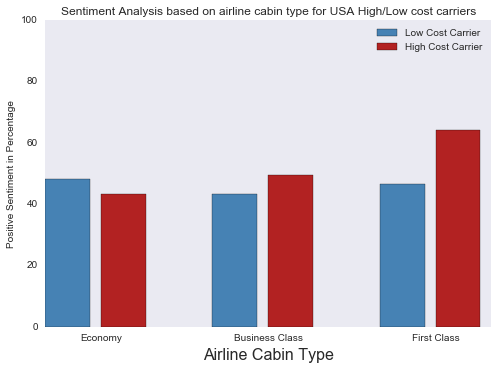

In [430]:
Low_Cost_Carrier = plt.Rectangle((1, 1), 0.5, 0.5, fc="steelblue")
High_Cost_Carrier = plt.Rectangle((1, 1), 0.5, 0.5, fc="firebrick")


plt.legend((Low_Cost_Carrier, High_Cost_Carrier), ('Low Cost Carrier','High Cost Carrier'), loc='upper right')

x = np.array([0,1,3,4,6,7])

y = np.array([low_cost_economy*100,high_cost_economy*100,low_cost_business*100, high_cost_business*100, low_cost_first*100, high_cost_first*100])

labels = ['','Economy',  '',  'Business Class', '', 'First Class']

plt.xticks(x, labels)

plt.bar(left = x, height=y, color=['steelblue', 'firebrick'])

plt.grid(which='both')
plt.title('Sentiment Analysis based on airline cabin type for USA High/Low cost carriers')
plt.ylabel('Positive Sentiment in Percentage', fontsize=10)
plt.xlabel('Airline Cabin Type', fontsize=16)

plt.axis([0,8, 0,100])

plt.show()

In [212]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["american-airlines"]

cabin_flown
Business Class     0.619565
Economy            0.278302
First Class        0.655172
Premium Economy    0.222222
Name: sentiment, dtype: float64

In [213]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["delta-air-lines"]

cabin_flown
Business Class     0.698413
Economy            0.495495
First Class        0.673913
Premium Economy    0.608696
Name: sentiment, dtype: float64

In [214]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["united-airlines"]

cabin_flown
Business Class     0.510000
Economy            0.270321
First Class        0.423529
Premium Economy    0.352000
Name: sentiment, dtype: float64

In [215]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["alaska-airlines"]

cabin_flown
Business Class    0.000000
Economy           0.575163
First Class       0.682927
Name: sentiment, dtype: float64

In [394]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["hawaiian-airlines"]

cabin_flown
Business Class     0.652174
Economy            0.552326
First Class        0.763158
Premium Economy    1.000000
Name: sentiment, dtype: float64

*** other airline ***

In [218]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["virgin-atlantic-airways"]

cabin_flown
Business Class     0.662921
Economy            0.488281
First Class        0.250000
Premium Economy    0.552381
Name: sentiment, dtype: float64

In [219]:
 airline_main.groupby(['airline_name', 'cabin_flown'])['sentiment'].mean()["virgin-australia"]

cabin_flown
Business Class     0.794118
Economy            0.591241
Premium Economy    0.703704
Name: sentiment, dtype: float64

*** finding features for negative/positive reviews low-cost/high-cost airlines ***

In [237]:
airline_main.loc[(airline_main['airline_name'] == 'virgin-australia') & (airline_main['sentiment'] == 1), ['content']] 

,content
39272,I booked via Etihad and the LHR to Abu Dhabi w...
39279,"Check in at Brisbane was poor, machines didn�t..."
39280,"We bought the tickets during a Virgin sale, so..."
39285,I was supposed to take the later flight to Mel...
39286,MEL-SYD return and multiple flights. Once agai...
39294,BNK-SYD and then SYD-BNE at the end of the day...
39301,VA883 MEL-SYD 21 May and VA866 SYD-MEL 23 May....
39302,First TransTasman Business Class flight on Vir...
39308,18/05/15 VA239 MEL-ADL Boeing 737. What a plea...
39322,AKL-SYD-DPS-BNE-AKL in Economy. All flights de...


*** low cost usa airlines positve sentiment features***

In [298]:
low_cost_usa = ["jetblue-airways", "spirit-airlines", "southwest-airlines", "allegiant-air", "frontier-airlines", "virgin-america", "skywest-airlines", "horizon-air" ]

In [323]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\low_cost_usa_p.txt',  airline_main.loc[(airline_main['airline_name'] == 'jetblue-airways') | (airline_main['airline_name'] == 'virgin-america') | (airline_main['airline_name'] == 'skywest-airlines') | (airline_main['airline_name'] == 'horizon-air') & (airline_main['sentiment'] == 1), ['content']] , fmt='%s')

In [324]:
filename = 'low_cost_usa_p.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_low_cost_usa_p.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 48319


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
flight 865
 711
time 231
seats 215
service 198
seat 176
good 173
great 172
first 170
crew 170
cabin 168
jetblue 166
staff 158
flights 156
us 144
airline 144
free 138
virgin 136
friendly 134
would 129
food 128
one 122
plane 120
jfk 119
get 104
return 102
experience 102
comfortable 102
boarding 101
hours 100
attendants 99
fly 96
flew 96
tv 95
nice 95
airlines 94
snacks 93
back 93
delayed 92
lax 91
entertainment 91
drinks 85
trip 83
class 79
$ 78
could 76
new 74
legroom 73
gate 73
even 72
hour 71
flying 71
minutes 70
america 70
well 68
system 68
sfo 68
pay 67
leg 66
checkin 66
made 65
extra 64
passengers 63
excellent 62
again 62
room 60
also 59
took 57
helpful 57
early 57
didn't 57
check 57
arrived 57
aircraft 57
really 56
last 56
got 56
baggage 56
airport 56
never 55
clean 55
boston 55
like 54
late 53
best 53
bag 53
two 52
select 52
economy 52
way 51
another 51
told 50
inflight 49
due 49
customer 49
short 48
main 48
long 4

In [326]:
words = re.findall('\w+', open('low_cost_usa_p.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:7: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


Counter({('main', 'cabin', 'select'): 23, ('first', 'time', 'flying'): 9, ('definitely', 'fly', 'again.'): 7, ('would', 'definitely', 'fly'): 7, ('flight', 'attendants', 'friendly'): 6, ('fly', 'jetblue', 'again.'): 6, ('new', 'york', 'jfk'): 5, ('would', 'fly', 'again.'): 5, ('great', 'entertainment', 'system'): 5, ('flights', 'left', 'time'): 5, ('left', 'time', 'arrived'): 5, ('main', 'cabin', 'select.'): 5, ('would', 'definitely', 'recommend'): 4, ('flew', 'virgin', 'america'): 4, ('delayed', '2', 'hours'): 4, ('never', 'fly', 'jetblue'): 4, ('return', 'flight', 'delayed'): 4, ('early', 'morning', 'flight'): 4, ('flight', 'delayed', '3'): 4, ('cabin', 'crew', 'friendly'): 4, ('upgraded', 'main', 'cabin'): 4, ('extra', 'leg', 'room'): 4, ('flight', 'next', 'day.'): 3, ('red', 'eye', 'flight'): 3, ('flight', 'delayed', '2'): 3, ('jetblue', 'again.', 'flew'): 3, ('first', 'time', 'virgin'): 3, ('fly', 'virgin', 'america'): 3, ('seats', 'leg', 'room'): 3, ('4', 'hour', 'flight'): 3, ('

***low cost usa airlines negative sentiment features***

In [328]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\low_cost_usa_n.txt',  airline_main.loc[(airline_main['airline_name'] == 'spirit-airlines') | (airline_main['airline_name'] == 'southwest-airlines') | (airline_main['airline_name'] == 'allegiant-air') | (airline_main['airline_name'] == 'frontier-airlines') & (airline_main['sentiment'] == 0), ['content']] , fmt='%s')

In [330]:
filename = 'low_cost_usa_n.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_low_cost_usa_n.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 301435


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 5437
flight 4837
time 1423
$ 1373
spirit 1276
airline 1273
plane 1254
would 1133
us 1072
get 1064
hours 1051
fly 1005
seats 951
airport 905
delayed 898
pay 842
one 834
flights 793
airlines 752
seat 747
service 745
told 715
bag 712
never 701
back 695
hour 688
boarding 660
gate 654
another 627
trip 623
check 590
again 578
got 576
even 570
could 547
first 536
minutes 504
customer 496
pm 488
frontier 486
way 484
flew 483
ticket 482
extra 481
allegiant 479
return 473
bags 468
staff 464
flying 464
people 457
next 457
don't 452
checked 449
arrived 447
southwest 442
delay 422
luggage 415
day 412
late 403
didn't 403
passengers 397
baggage 394
vegas 393
last 388
experience 388
fees 383
charge 379
carry 369
line 363
said 361
paid 360
take 359
due 353
like 349
finally 346
go 341
cancelled 338
home 332
going 332
two 328
denver 328
also 326
attendants 325
free 324
cost 313
good 309
crew 301
left 299
made 296
booked 295
water 294
make

In [332]:
words = re.findall('\w+', open('low_cost_usa_n.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:7: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


Counter({('never', 'fly', 'spirit'): 77, ('fly', 'spirit', 'again.'): 64, ('fly', 'airline', 'again.'): 44, ('print', 'boarding', 'pass'): 38, ('first', 'time', 'flying'): 37, ('never', 'fly', 'airline'): 36, ('never', 'fly', 'frontier'): 33, ('never', 'fly', 'again.'): 33, ('first', 'last', 'time'): 28, ('fly', 'frontier', 'again.'): 28, ('get', 'pay', 'for.'): 27, ('flight', 'delayed', '3'): 26, ('fly', 'spirit', 'airlines'): 25, ('delayed', '4', 'hours'): 25, ('delayed', '2', 'hours'): 24, ('seats', "don't", 'recline'): 23, ('next', 'available', 'flight'): 22, ('flight', 'scheduled', 'leave'): 21, ('printed', 'boarding', 'pass'): 21, ('printed', 'boarding', 'passes'): 21, ('flight', 'delayed', '2'): 19, ('delayed', '3', 'hours'): 19, ('flew', 'round', 'trip'): 18, ('spirit', 'airlines', 'again.'): 18, ('told', 'flight', 'delayed'): 17, ('time', 'flying', 'spirit'): 17, ('flight', 'next', 'day'): 16, ('fly', 'allegiant', 'again.'): 16, ('poor', 'customer', 'service'): 15, ('airport',

***high cost usa airlines positive sentiment features***

In [345]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\high_cost_usa_p.txt',  airline_main.loc[(airline_main['airline_name'] == 'delta-air-lines') | (airline_main['airline_name'] == 'alaska-airlines') | (airline_main['airline_name'] == 'hawaiian-airlines') & (airline_main['sentiment'] == 1), ['content']] , fmt='%s')

In [346]:
filename = 'high_cost_usa_p.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_high_cost_usa_p.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 98138


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 1641
flight 1548
delta 668
service 529
time 488
first 428
seats 416
class 399
flights 394
good 380
food 368
seat 338
us 331
plane 290
crew 280
would 274
staff 269
one 257
flew 234
alaska 226
fly 225
get 218
back 218
economy 212
great 209
cabin 201
airlines 199
hours 196
return 195
hour 191
business 184
airline 179
entertainment 172
experience 164
got 161
friendly 160
gate 156
trip 154
comfortable 151
passengers 150
even 148
next 145
airport 144
atlanta 142
arrived 141
boarding 140
excellent 131
attendants 131
minutes 130
meal 130
new 128
seattle 125
told 123
flying 123
delayed 122
could 121
nice 120
due 119
well 118
didn't 118
way 116
much 116
again 115
served 113
aircraft 112
better 111
lax 110
late 110
air 110
drinks 109
honolulu 108
also 108
never 104
two 103
comfort 103
inflight 102
leg 100
left 100
check 100
like 99
really 96
long 96
$ 95
made 92
free 92
make 91
customer 91
took 90
jfk 90
another 90
however 88
hawa

In [349]:
words = re.findall('\w+', open('high_cost_usa_p.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in stop_words]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('fly', 'delta', 'again.'): 20, ('never', 'fly', 'delta'): 16, ('flew', 'first', 'class'): 11, ('economy', 'comfort', 'seats'): 11, ('would', 'definitely', 'fly'): 11, ('salt', 'lake', 'city'): 9, ('flight', 'left', 'time'): 8, ('never', 'fly', 'again.'): 7, ('flight', 'attendants', 'friendly'): 7, ('first', 'class', 'ticket'): 7, ('left', 'arrived', 'time.'): 7, ('cabin', 'crew', 'friendly'): 7, ('first', 'class', 'seats'): 7, ('-', 'atlanta', '-'): 6, ('would', 'recommend', 'delta'): 6, ('miss', 'connecting', 'flight'): 6, ('flight', 'attendants', 'good'): 6, ('air', 'new', 'zealand'): 6, ('definitely', 'fly', 'delta'): 6, ('would', 'fly', 'again.'): 6, ('first', 'class', 'seat'): 6, ('upgraded', 'first', 'class'): 5, ('business', 'class', 'flight'): 5, ('delayed', '3', 'hours.'): 5, ('missed', 'connecting', 'flight'): 5, ('first', 'time', 'flying'): 5, ('movies', 'tv', 'shows'): 5, ('definitely', 'fly', 'again.'): 5, ('business', 'class', 'seat'): 5, ('first', 'class', 'cab

***high cost usa airlines negative sentiment features***

In [339]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\high_cost_usa_n.txt',  airline_main.loc[(airline_main['airline_name'] == 'american-airlines') | (airline_main['airline_name'] == 'united-airlines') & (airline_main['sentiment'] == 0), ['content']] , fmt='%s')

In [340]:
filename = 'high_cost_usa_n.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_high_cost_usa_n.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 188895


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 3626
flight 3223
united 886
us 828
service 758
plane 721
time 689
hours 641
aa 605
flights 585
get 580
one 567
first 554
seats 548
would 547
seat 527
hour 506
airlines 485
food 454
class 449
airline 434
crew 432
delayed 423
told 411
back 410
fly 405
american 399
staff 397
even 397
gate 379
airport 375
passengers 353
never 351
got 345
could 344
next 340
new 327
customer 323
another 318
minutes 300
good 296
due 293
flying 279
business 276
flew 271
day 268
late 266
experience 266
trip 262
return 260
pm 259
cancelled 258
chicago 246
last 241
cabin 241
two 239
connecting 236
way 235
boarding 234
people 232
entertainment 228
arrived 227
aircraft 225
again 223
delay 217
economy 211
made 208
like 204
old 203
attendants 203
finally 201
asked 199
check 198
luggage 196
booked 194
take 192
didn't 192
took 184
pay 183
make 183
leg 180
later 179
$ 179
long 175
board 174
connection 172
wait 167
rude 166
go 166
line 165
bag 165
home 16

In [343]:
words = re.findall('\w+', open('high_cost_usa_n.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in stop_words]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('never', 'fly', 'united'): 37, ('missed', 'connecting', 'flight'): 27, ('fly', 'united', 'again.'): 25, ('main', 'cabin', 'extra'): 18, ('fly', 'american', 'airlines'): 15, ('flight', 'next', 'day'): 14, ('delayed', '2', 'hours'): 14, ('fly', 'aa', 'again.'): 14, ('never', 'fly', 'aa'): 13, ('never', 'fly', 'again.'): 13, ('miss', 'connecting', 'flight'): 13, ('first', 'last', 'time'): 12, ('flight', 'delayed', 'due'): 12, ('fasten', 'seatbelt', 'sign'): 12, ('never', 'fly', 'airline'): 12, ('fly', 'airline', 'again.'): 11, ('flight', 'delayed', '2'): 10, ('never', 'fly', 'american'): 10, ('business', 'class', 'seats'): 10, ('extra', 'leg', 'room'): 10, ('flight', 'cancelled', 'due'): 9, ('next', 'available', 'flight'): 9, ('flight', 'next', 'day.'): 8, ('star', 'alliance', 'gold'): 8, ('fly', 'american', 'again.'): 8, ('business', 'class', 'seat'): 8, ('customer', 'service', 'desk'): 8, ('2', 'hour', 'delay'): 8, ('6', 'hour', 'flight'): 8, ('asked', 'flight', 'attendant'): 

*** jetblue ***

In [316]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\jetblue_positive.txt',  airline_main.loc[(airline_main['airline_name'] == 'jetblue-airways') & (airline_main['sentiment'] == 1), ['content']] , fmt='%s')

In [266]:
filename = 'jetblue_positive.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_jetblue_p.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 11181
------------------------------
sorted by highest frequency first:
flight 223
 139
time 77
great 72
service 68
free 67
jetblue 65
flights 62
snacks 59
jfk 58
good 58
seats 56
crew 54
seat 47
friendly 46
legroom 42
tv 40
experience 40
first 39
airline 39
staff 35
flew 35
us 33
entertainment 33
nice 31
drinks 30
even 28
comfortable 28
cabin 28
return 27
delayed 27
would 26
trip 26
fly 26
excellent 26
attendants 25
leg 24
well 23
boarding 23
also 23
one 22
back 22
short 21
room 21
airlines 21
helpful 20
bag 20
took 19
really 19
new 19
minutes 19
hour 19
check 19
arrived 19
space 18
mint 18
extra 18
boston 18
best 18
way 17
though 17
plane 17
long 17
like 17
hours 17
flying 17
clean 17
better 17
again 17
a 17
plenty 16
inflight 16
early 16
class 16
use 15
pleasant 15
overall 15
onboard 15
made 15
jet 15
food 15
blue 15
passengers 14
happy 14
get 14
efficient 14
smooth 13
price 13
late 13
i've 13
every 13
don't 13
times 12
still 12
left 12
lax 12
international 12
e 12
co

In [268]:
words = re.findall('\w+', open('jetblue_positive.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('definitely', 'fly', 'again.'): 5, ('new', 'york', 'jfk'): 5, ('would', 'definitely', 'fly'): 5, ('first', 'time', 'flying'): 4, ('jetblue', 'terminal', 'jfk'): 3, ('plenty', 'leg', 'room'): 3, ('mint', 'class', 'lax'): 3, ('first', 'bag', 'free'): 3, ('best', "i've", 'inflight'): 2, ('red', 'eye', 'flight'): 2, ('clean', 'well', 'maintained.'): 2, ('first', 'class', "don't"): 2, ('would', 'definitely', 'recommend'): 2, ('flight', 'delayed', '2'): 2, ('definitely', 'fly', 'jetblue'): 2, ('flight', 'left', 'time'): 2, ('1', 'hour', 'flight'): 2, ('captain', 'kept', 'us'): 2, ('takes', 'long', 'time'): 2, ('jetblue', 'again.', 'flew'): 2, ('extra', 'legroom', 'seats'): 2, ('checking-in', 'boarding', 'flight'): 2, ('flight', 'attendants', 'friendly.'): 2, ('flew', 'mint', 'class'): 2, ('free', 'snacks', 'drinks'): 2, ('great.', 'would', 'definitely'): 2, ('late', 'landed', 'time.'): 2, ('jfk', 'fort', 'myers.'): 2, ('well', 'worth', 'extra'): 2, ('around', '30', 'minutes'): 2, (

*** virgin australia ***

In [260]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\content.txt',  airline_main.loc[(airline_main['airline_name'] == 'virgin-australia') & (airline_main['sentiment'] == 1), ['content']] , fmt='%s')

In [262]:
filename = 'content.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 21343


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 406
flight 327
service 139
good 133
food 121
virgin 115
crew 115
cabin 110
seat 104
seats 103
staff 101
time 100
flights 97
business 95
great 92
return 87
va 86
economy 84
excellent 83
entertainment 82
friendly 79
class 72
melbourne 70
comfortable 68
would 66
australia 64
sydney 60
aircraft 58
plane 53
offered 50
flew 49
one 48
airline 45
fly 44
water 42
check 40
qantas 39
much 39
inflight 39
well 38
premium 38
leg 38
ife 38
brisbane 38
passengers 35
drinks 35
boarding 35
overall 34
flying 33
new 32
served 31
again 31
hour 30
meal 29
hours 29
experience 29
best 29
back 29
perth 28
however 28
arrived 28
also 28
row 27
left 27
lax 27
first 27
even 27
could 27
a 27
pleasant 26
helpful 26
attentive 26
late 25
choice 25
snack 24
legroom 24
got 24
better 24
available 24
us 23
movies 23
long 23
found 23
domestic 23
clean 23
professional 22
pretty 22
nice 22
lounge 22
last 22
international 22
full 22
average 22
system 21
small 

unigrams:
service 139,
good 133,
food 121,
crew 115,
cabin 110,
seat 104

bigram:
('business', 'class'): 49, 
('cabin', 'crew'): 46, 
('seats', 'comfortable'): 18,
('inflight', 'entertainment'): 16, 
('leg', 'room'): 14, 
('staff', 'friendly'): 12


In [264]:
words = re.findall('\w+', open('content.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:7: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


Counter({('cabin', 'crew', 'friendly'): 6, ('flight', 'left', 'time'): 5, ('virgin', 'australia', 'again.'): 5, ('tea', 'coffee', 'water'): 5, ('offered', 'juice', 'water'): 4, ('flying', 'virgin', 'australia'): 4, ('would', 'definitely', 'recommend'): 4, ('definitely', 'fly', 'virgin'): 4, ('front', 'row', 'economy'): 4, ('recommend', 'flying', 'virgin'): 3, ('flew', 'business', 'class'): 3, ('flight', 'cabin', 'crew'): 3, ('good.', 'return', 'flight'): 3, ('staff', 'friendly', 'food'): 3, ('cabin', 'crew', 'good.'): 3, ('fly', 'virgin', 'australia'): 3, ('would', 'recommend', 'flying'): 3, ('business', 'class', 'sydney'): 3, ('well', 'done', 'virgin'): 3, ('entertainment', 'system', 'excellent'): 3, ('juice', 'water', 'prior'): 3, ('flew', 'virgin', 'australia'): 3, ('return', 'flight', 'sydney'): 3, ('self', 'service', 'bar'): 3, ('would', 'definitely', 'fly'): 3, ('recommend', 'virgin', 'australia'): 3, ('first', 'time', 'flying'): 3, ('nothing', 'much', 'trouble.'): 3, ('business'

trigram:
('cabin', 'crew', 'friendly'): 6,
('flight', 'left', 'time'): 5,
('offered', 'juice', 'water'): 4,
('entertainment', 'system', 'excellent'): 3,
('cabin', 'crew', 'good.'): 3,
('luggage', 'delivered', 'promptly.'): 2

*** united airlines***

In [351]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\united_negative.txt',  airline_main.loc[(airline_main['airline_name'] == 'united-airlines') & (airline_main['sentiment'] == 0), ['content']] , fmt='%s')

In [352]:
filename = 'united_negative.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_united_negative.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 97593


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 1786
flight 1722
united 870
plane 408
us 405
hours 397
service 395
time 349
get 339
flights 306
one 303
would 294
hour 271
seat 263
first 258
told 256
seats 249
airline 248
delayed 231
back 231
airport 224
fly 216
airlines 213
customer 207
even 204
never 203
got 200
food 200
could 195
next 194
staff 190
gate 185
another 183
crew 180
class 169
passengers 167
cancelled 167
minutes 164
due 164
late 163
flying 158
ua 152
last 150
connecting 147
chicago 144
trip 142
pm 142
day 141
people 139
experience 132
two 129
flew 129
arrived 128
houston 124
economy 123
newark 121
new 120
way 119
asked 119
return 118
booked 118
delay 117
finally 116
business 116
luggage 115
boarding 113
aircraft 112
make 111
entertainment 110
like 109
later 108
again 108
connection 107
made 106
go 105
take 104
pay 103
$ 102
good 99
bag 98
attendants 98
travel 97
went 96
going 96
wait 95
hotel 95
didn't 94
home 92
put 91
denver 91
weather 90
took 90
also

In [354]:
words = re.findall('\w+', open('united_negative.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in stop_words]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('never', 'fly', 'united'): 37, ('fly', 'united', 'again.'): 25, ('missed', 'connecting', 'flight'): 18, ('fasten', 'seatbelt', 'sign'): 12, ('delayed', '2', 'hours'): 9, ('star', 'alliance', 'gold'): 8, ('flight', 'delayed', 'due'): 8, ('flight', 'next', 'day'): 8, ('customer', 'service', 'desk'): 8, ('never', 'fly', 'again.'): 7, ('miss', 'connecting', 'flight'): 7, ('flight', 'cancelled', 'due'): 7, ('air', 'new', 'zealand'): 7, ('customer', 'service', 'line'): 7, ('avoid', 'flying', 'united'): 6, ('make', 'matters', 'worse'): 6, ('united', 'airlines', 'again.'): 6, ('6', 'hour', 'flight'): 6, ('economy', 'plus', 'seats'): 6, ('never', 'fly', 'airline'): 6, ('connecting', 'flight', 'denver'): 5, ('went', 'customer', 'service'): 5, ('called', 'customer', 'service'): 5, ('experience', 'united', 'airlines'): 5, ('fly', 'united', 'airlines'): 5, ('customer', 'service', 'rep'): 5, ('worst', 'travel', 'experience'): 5, ('next', 'available', 'flight'): 5, ('flying', 'united', 'aga

***Virgin-Atlantic - other***

In [356]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\virgin_atlantic_negative.txt',  airline_main.loc[(airline_main['airline_name'] == 'virgin-atlantic-airways') & (airline_main['sentiment'] == 0), ['content']] , fmt='%s')

In [357]:
filename = 'virgin_atlantic_negative.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_virgin_atlantic_negative.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 41160


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 615
flight 407
virgin 282
seat 207
service 193
economy 190
food 182
seats 173
staff 139
crew 139
would 132
one 122
return 120
time 116
class 104
cabin 101
premium 100
back 99
get 97
good 96
plane 92
us 91
experience 88
entertainment 87
meal 86
could 86
vs 76
even 76
fly 75
passengers 72
hours 71
flew 71
first 70
much 69
upper 67
like 67
again 66
never 64
airline 64
london 63
hour 63
new 62
front 60
told 59
extra 58
flights 57
way 55
poor 55
drinks 55
didn't 55
asked 55
served 53
got 53
small 52
really 52
heathrow 52
check 52
better 50
room 49
system 48
atlantic 48
airlines 47
ba 46
given 45
two 44
offered 44
great 44
boarding 44
lhr 43
flying 43
aircraft 43
leg 42
customer 42
choice 42
also 41
nice 40
little 40
inflight 40
business 40
years 39
uncomfortable 39
people 39
long 39
journey 39
drink 39
a 39
ok 38
don't 38
breakfast 38
worst 37
screen 37
quality 37
bad 37
travelled 36
times 36
said 36
last 35
however 35
found

In [359]:
words = re.findall('\w+', open('virgin_atlantic_negative.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in stop_words]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('never', 'fly', 'virgin'): 11, ('fly', 'virgin', 'again.'): 10, ('would', 'fly', 'virgin'): 9, ('extra', 'leg', 'room'): 9, ('air', 'new', 'zealand'): 7, ('extra', 'legroom', 'seats'): 6, ('virgin', 'upper', 'class'): 5, ('long', 'haul', 'flights'): 5, ('premium', 'economy', 'seats'): 5, ('11', 'hour', 'flight'): 4, ('virgin', 'again.', 'travelled'): 4, ('person', 'front', 'reclines'): 4, ('paid', 'extra', 'leg'): 3, ('flying', 'virgin', 'again.'): 3, ('los', 'angeles', 'london'): 3, ('seat', 'front', 'me.'): 3, ('us', 'premium', 'economy'): 3, ('flight.', 'would', 'fly'): 3, ('economy', 'seats', 'uncomfortable'): 3, ('used', 'virgin', 'atlantic'): 3, ('premium', 'economy', 'passengers'): 3, ('inconvenience.', 'said', '"no".'): 3, ('virgin', 'customer', 'service'): 3, ('atlantic', 'many', 'years'): 3, ('inflight', 'entertainment', 'system'): 3, ('would', 'never', 'fly'): 3, ('seat', 'front', 'reclined'): 3, ('virgin', 'atlantic', 'many'): 3, ('12', 'hour', 'flight'): 3, ('ask

*** virgin america ***

In [360]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\virgin_america_positive.txt',  airline_main.loc[(airline_main['airline_name'] == 'virgin-america') & (airline_main['sentiment'] == 1), ['content']] , fmt='%s')

In [361]:
filename = 'virgin_america_positive.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_virgin_america_positive.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 12533


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
flight 170
 153
cabin 88
virgin 76
good 70
food 68
great 65
staff 61
seats 60
friendly 59
first 58
service 55
crew 50
time 49
comfortable 45
seat 44
lax 44
flights 43
attendants 41
entertainment 40
airline 40
nice 39
america 39
free 38
system 37
sfo 36
select 36
tv 35
main 34
drinks 34
class 34
us 33
return 33
boarding 33
airlines 33
one 32
flew 32
would 31
plane 31
economy 31
early 30
flying 29
clean 29
experience 28
checkin 28
lighting 26
back 26
new 25
ife 24
inflight 23
domestic 23
baggage 23
trip 22
excellent 22
best 22
a 22
music 21
movies 21
fly 21
could 21
snacks 20
order 20
leg 20
helpful 20
$ 20
well 19
san 19
available 19
aircraft 19
vegas 17
selection 17
screen 17
room 17
professional 17
priority 17
pleasant 17
pay 17
mood 17
little 17
really 16
much 16
money 16
made 16
ground 16
get 16
also 16
wifi 15
short 15
las 15
francisco 15
drink 15
choice 15
check 15
bit 15
better 15
attentive 15
satellite 14
passenge

In [363]:
words = re.findall('\w+', open('virgin_america_positive.txt').read().lower())

stop_words = set(stopwords.words('english'))
stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year']) # remove it if you need punctuation


word_list = [w.strip() for w in word_list if w.strip() not in stop_words]


print(Counter(zip(word_list,word_list[1:],word_list[2:])))

Counter({('main', 'cabin', 'select'): 18, ('main', 'cabin', 'select.'): 5, ('great', 'entertainment', 'system'): 4, ('upgraded', 'main', 'cabin'): 4, ('flight', 'attendants', 'friendly'): 4, ('virgin', 'america', 'first'): 3, ('left', 'time', 'arrived'): 3, ('fly', 'virgin', 'america'): 3, ('would', 'fly', 'again.'): 3, ('time', 'flying', 'virgin'): 3, ('comfortable', 'leather', 'seats'): 3, ('flights', 'left', 'time'): 3, ('flying', 'virgin', 'america'): 3, ('flight', 'attendants', 'young'): 3, ('virgin', 'america', 'great'): 3, ('first', 'time', 'flying'): 3, ('las', 'vegas', 'san'): 3, ('never', 'grumpy', 'flight'): 2, ('attendants', 'friendly', 'helpful'): 2, ('world', 'series', 'highlights'): 2, ('order', 'food', 'drinks'): 2, ('blankets', 'pillows', 'nice'): 2, ('inflight', 'entertainment', 'good'): 2, ('show', 'world', 'series'): 2, ('flight', 'crew', 'attentive'): 2, ('many', 'options', 'available'): 2, ('giants', 'particular', 'route'): 2, ('cabin', 'select.', 'flight'): 2, ('

*** american airline ***

In [365]:
np.savetxt(r'C:\Users\angad2811\Desktop\jhu2017\project\american_airlines_negative.txt',  airline_main.loc[(airline_main['airline_name'] == 'american-airlines') & (airline_main['sentiment'] == 0), ['content']] , fmt='%s')

In [366]:
filename = 'american_airlines_negative.txt'

all_words = []

# create list of lower case words
word_list = re.split('\s+', open(filename).read().lower())
print 'Words in text:', len(word_list)

word_list2 = [w.strip() for w in word_list if w.strip() not in nltk.corpus.stopwords.words('english')]



# create dictionary of word:frequency pairs
freq_dic = {}
# punctuation and numbers to be removed
punctuation = re.compile(r'[-.?!,":;&()|0-9]') 
for word in word_list2:
    # remove punctuation marks
    word = punctuation.sub("", word)
    # form dictionary
    try: 
        freq_dic[word] += 1
    except: 
        freq_dic[word] = 1


print '-'*30
print "sorted by highest frequency first:"
# create list of (val, key) tuple pairs
freq_list2 = [(val, key) for key, val in freq_dic.items()]
# sort by val or frequency
freq_list2.sort(reverse=True)
freq_list3 = list(freq_list2)
# display result
for freq, word in freq_list2:
    print word, freq
    all_words.append(word)
f = open("wordfreq_american_airlines_negative.txt", "w")
f.write( str(freq_list3) )
f.close()

Words in text: 67315


C:\Anaconda2\lib\site-packages\ipykernel\__main__.py:9: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


------------------------------
sorted by highest frequency first:
 1305
flight 1160
aa 388
us 355
american 297
plane 248
time 239
airlines 222
hours 221
would 214
service 214
get 210
one 208
hour 194
seats 191
flights 187
first 181
gate 174
seat 173
delayed 163
fly 159
back 157
airline 157
even 156
told 152
passengers 152
staff 148
crew 143
airport 139
never 134
class 134
next 133
could 130
food 122
another 121
got 120
pm 114
day 114
new 109
customer 107
minutes 106
dallas 103
flying 97
due 96
check 96
again 95
way 89
return 89
cancelled 89
boarding 89
people 87
miami 87
flew 86
trip 85
late 85
didn't 85
connecting 84
arrived 84
two 82
made 82
finally 82
delay 82
dfw 81
cabin 81
take 79
old 78
board 77
line 75
last 75
experience 75
attendants 75
asked 75
said 74
business 74
took 72
good 72
rude 71
pay 71
luggage 70
chicago 70
home 69
booked 69
long 68
left 68
entertainment 68
$ 67
like 66
later 66
wait 64
jfk 64
hotel 64
extra 64
am 64
aircraft 63
morning 62
put 61
make 61
given 61
leg